In [51]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.optimize import curve_fit
import os
import datetime as dt
import natsort 
import glob
plt.style.use('../../style.mplstyle')
colors = plt.rcParams['axes.prop_cycle'].by_key()['color']
import matplotlib.colors as coloUrs
import matplotlib.cm as cmx

In [52]:
def get_color_map(n,name='viridis'):
    colormap=plt.get_cmap(name)
    cNorm= coloUrs.Normalize(vmin=0,vmax=n-1)
    scalarMap=cmx.ScalarMappable(norm=cNorm,cmap=colormap)
    outmap=[]
    for i in range(n):
        outmap.append(scalarMap.to_rgba(i))
    return outmap,scalarMap

In [53]:

def rebin(hx,h,bins):
    h_rebin=[]
    # hx_rebin=[]
    for i in range(int(len(h)/bins)):
        start_idx=i*bins
        end_idx=(i+1)*bins
        h_rebin.append(np.sum(h[start_idx:end_idx]))
        # hx_rebin.append(np.mean(hx[start_idx:end_idx]))
    hx_rebin=range(len(h_rebin))
    return np.array(hx_rebin), np.array(h_rebin)

In [54]:
def gauss(x,a,b,c):
    return a*np.exp(-(x-b)**2/(2*c**2))

def line(x,a,b):
    return a*(x-b)

Number of files: 60


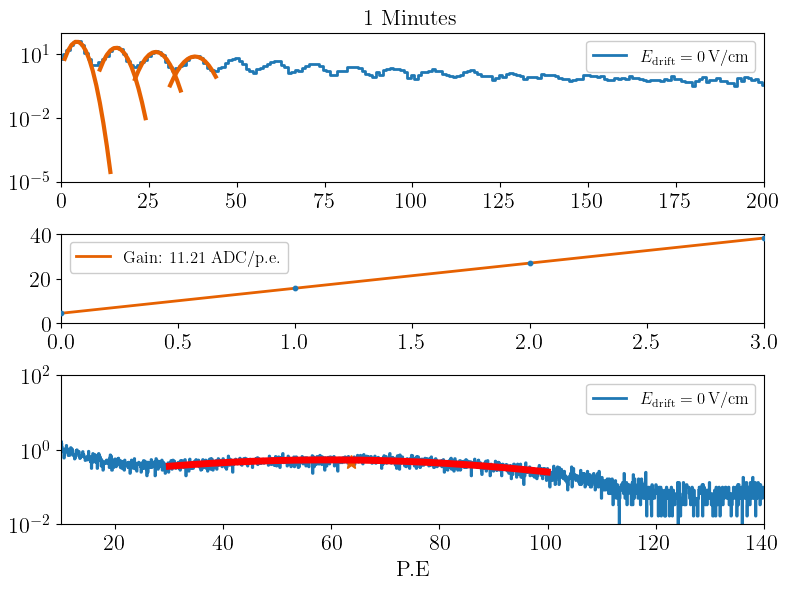

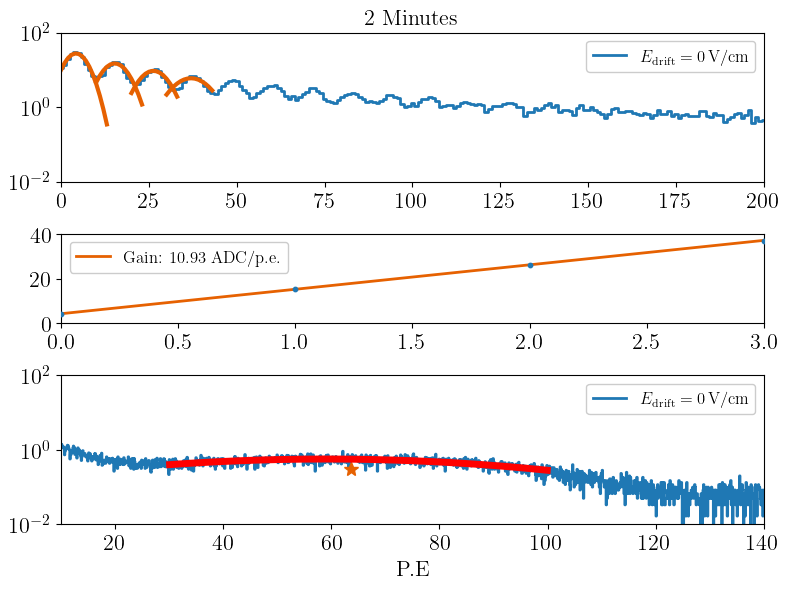

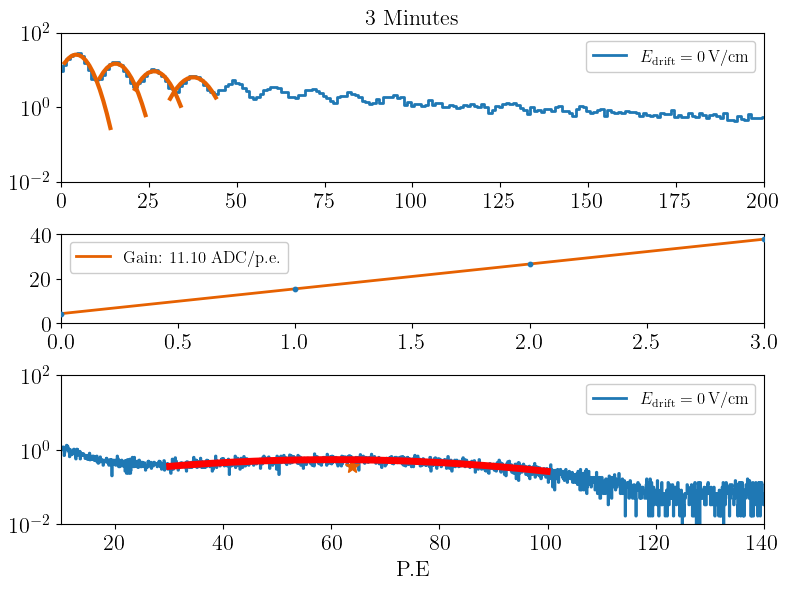

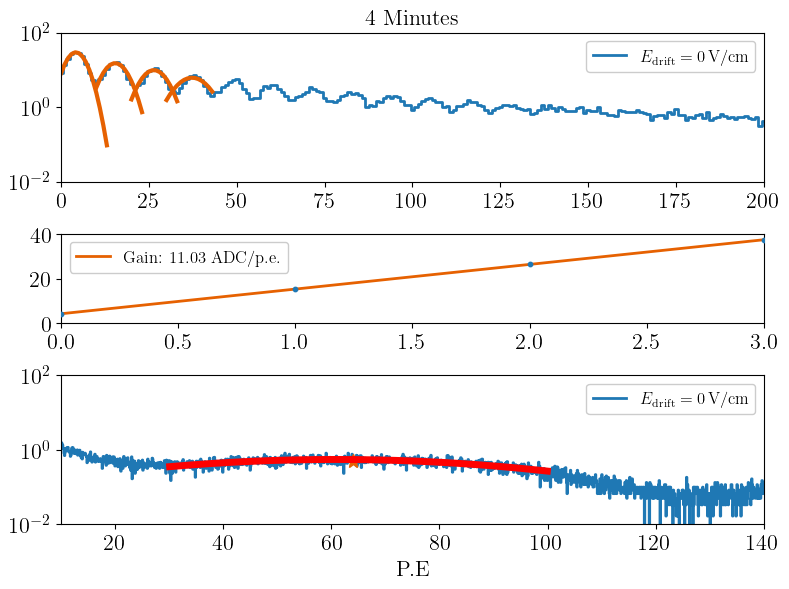

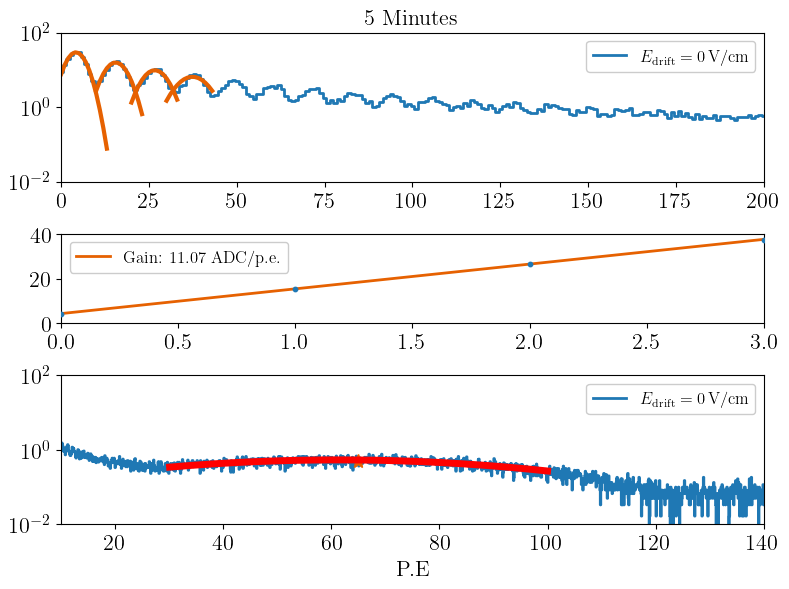

...

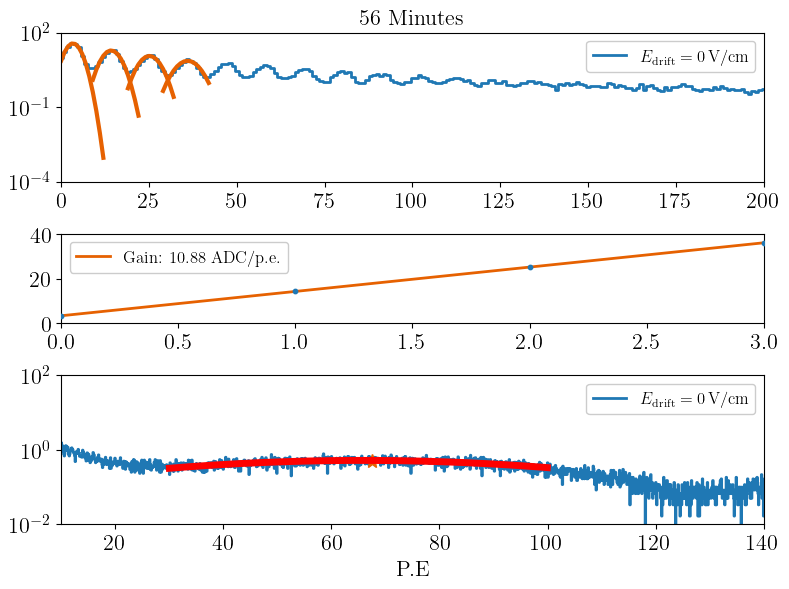

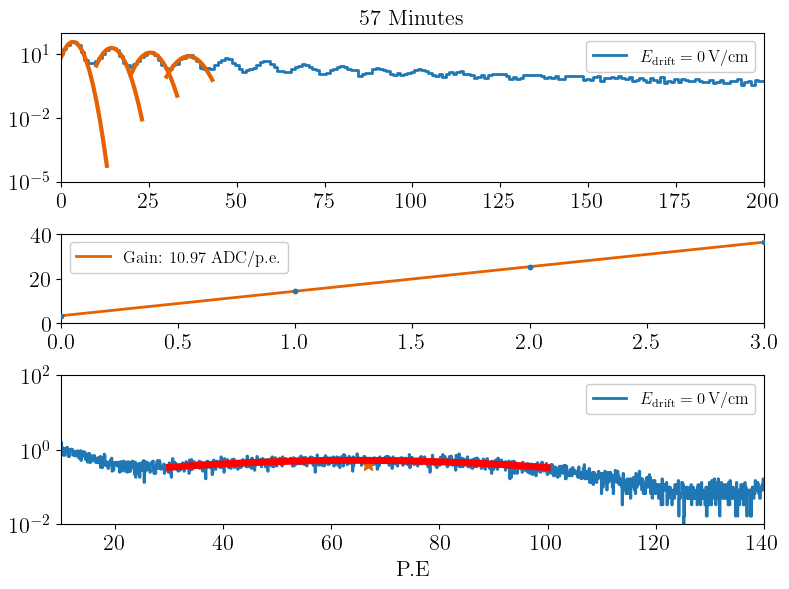

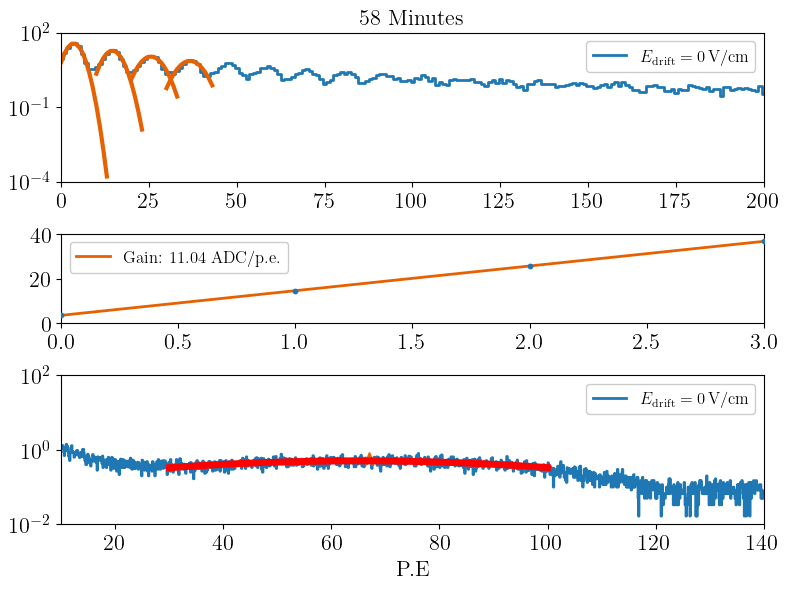

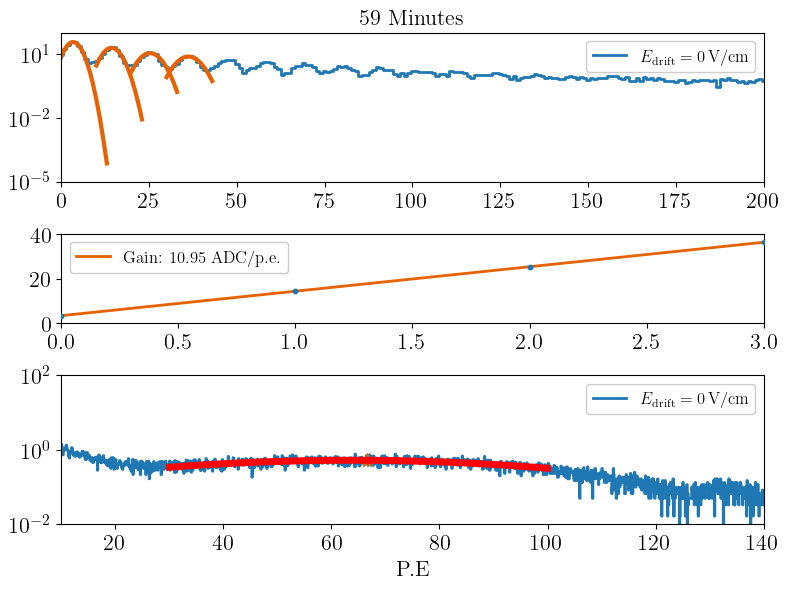

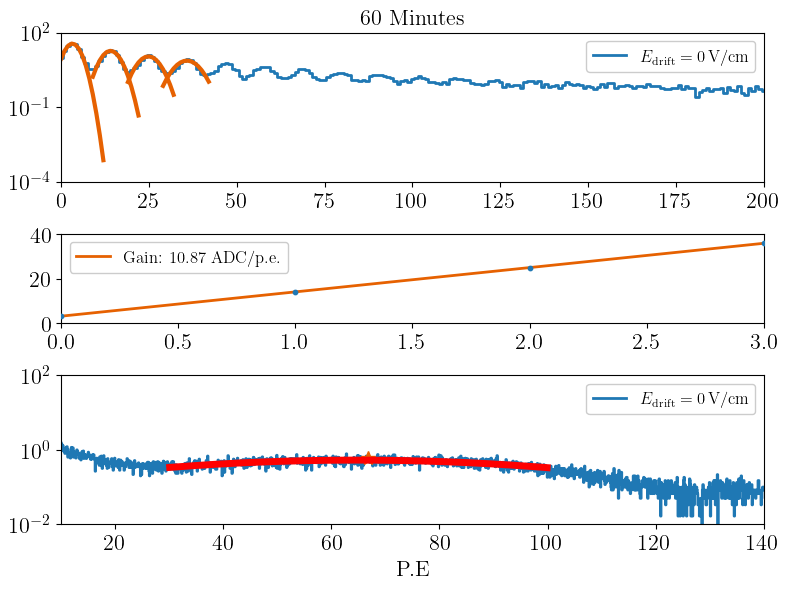

In [55]:
gain_single_pe_0=[]
intercept_0=[]
sumdata = 0
mu_cdf_0=[]

calib_pe_0=[]
calib_count_0=[]

mu_gauss_list_0V=[]
mu_gauss_err_0V=[]

BINS=10 #bins for rebinning

Path = "C:\\Users\\nEXO\\Downloads\\SiPM_response_LXe_0V\\"

Files = glob.glob(Path+"*.csv")
print('Number of files: {}'.format(len(Files)))

for j,f in enumerate(natsort.natsorted(Files)): 
    data = pd.read_csv(f, delimiter=',', skiprows=1)
    hx_nof,h_nof = rebin(np.array(data['Channel']), np.array(data['Counts']), BINS)
    # h_nof = h_nof/np.sum(h_nof)
    h_nof = h_nof/60 #Since each file is 1 minute long, we calulate the rate by dividing by 60s

    f, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [5, 3, 5]})
    ax[0].set_xlim(0,200)
    ax[0].set_yscale('log')
    ax[0].step(hx_nof,h_nof, label='$E_\mathrm{{drift}} = {}\,$V/cm'.format(0), where='mid')
    ax[0].set_title(str(j+1)+' Minutes')
    p0 = hx_nof[np.where(h_nof == np.max(h_nof))][0]
    params = []
    for i in range(4):

        if(i>0): p0 = p0 + 10

        # select events around that peak
        cut = np.where((hx_nof>p0-3) & (hx_nof<p0+3))

        #find position of max in the selected region
        p0_max = hx_nof[np.where(h_nof == np.max(h_nof[cut]))][0]

        # redefine selection cut based on true peak position
        cut = np.where((hx_nof>p0-5) & (hx_nof<p0+10))

        # run and plot fit
        popt,pcov = curve_fit(gauss, hx_nof[cut], h_nof[cut], p0=[np.max(h_nof[cut]),p0,1],maxfev=100000)
        ax[0].plot(hx_nof[cut], gauss(hx_nof[cut], *popt), color=colors[1],lw=3)
        # ax[0].set_ylim(1E-5,1E-1)
        
        # append best fit parameters
        params.append(popt)
    ax[0].legend(loc='upper right')
    # ax[1].set_xlim(0,9)
    xdata = [i for i,x in enumerate(params)]
    ax[1].scatter(xdata, np.array(params)[:,1], s=10, zorder=10)
    popt_nof,pcov = curve_fit(line, xdata, np.array(params)[:,1], p0=[10,0] )
    gain_single_pe_0.append(popt_nof[0])
    intercept_0.append(popt_nof[1])
    ax[1].plot(xdata, line(xdata, *popt_nof), color=colors[1], label='Gain: {:.2f} ADC/p.e.'.format(popt_nof[0]))
    ax[1].legend(loc='upper left')

    calib_pe=hx_nof/popt_nof[0]+popt_nof[1]
    ax[2].step(calib_pe,h_nof, label='$E_\mathrm{{drift}} = {}\,$V/cm'.format(0))
    ax[2].set_xlim(10,140)
    # ax[2].set_xlim(0,10)
    ax[2].set_xlabel('P.E')
    ax[2].legend(loc='upper right')
    ax[2].set_yscale('log')
    

    #append the calibrated data into a list of arrays
    calib_pe_0.append(np.array(calib_pe+1))
    calib_count_0.append(np.array(h_nof))

    # Now find the cdf of the source bump
    cut_median=np.where((calib_pe>25) & (calib_pe<120))
    cdf=np.cumsum(h_nof[cut_median])/np.sum(h_nof[cut_median])
    mu_interp=np.interp(0.5,cdf,calib_pe[cut_median])
    # mu_cdf_0.append(mu_interp)
    mu_idx=np.argmin(np.abs(calib_pe-mu_interp))
    ax[2].plot(calib_pe[mu_idx],h_nof[mu_idx],'*')
    mu_cdf_0.append(calib_pe[mu_idx])


    #now we fit the gaussian to the source bump
    cut_gauss=np.where((calib_pe>30) & (calib_pe<100))
    popt_bump,pcov_bump=curve_fit(gauss,calib_pe[cut_gauss],h_nof[cut_gauss],p0=[np.max(h_nof[cut_gauss]),60,100],maxfev=100000)
    ax[2].plot(calib_pe[cut_gauss],gauss(calib_pe[cut_gauss],*popt_bump),color='r',lw=5,label=str(popt_bump))
    mu_gauss_list_0V.append(popt_bump[1])
    mu_gauss_err_0V.append(np.sqrt(np.diag(pcov_bump))[1])


    plt.tight_layout()
    # plt.savefig('analysis_sample.pdf')
    plt.show()

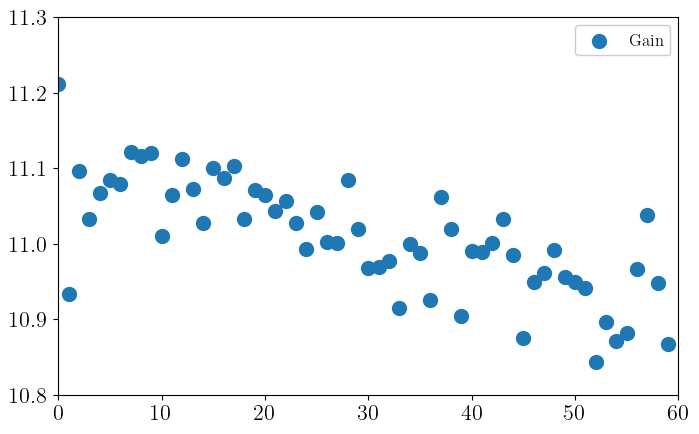

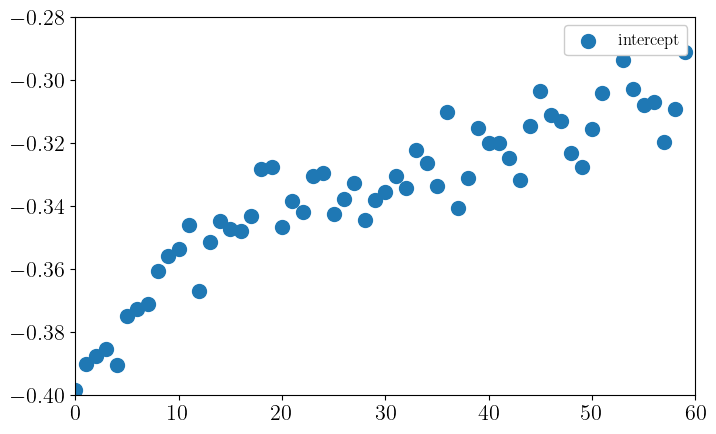

In [56]:
time_0V=np.arange(0,60,1)
plt.figure(figsize=(8,5))
plt.scatter(time_0V,gain_single_pe_0,label='Gain')
plt.legend(loc=1)
plt.figure(figsize=(8,5))
plt.scatter(time_0V,intercept_0,label='intercept')
plt.legend(loc=1)
plt.show()

In [57]:

def rebin_(hx,h,bins):
    h_rebin=[]
    hx_rebin=[]
    for i in range(int(len(h)/bins)):
        start_idx=i*bins
        end_idx=(i+1)*bins
        h_rebin.append(np.sum(h[start_idx:end_idx]))
        hx_rebin.append(np.mean(hx[start_idx:end_idx]))
    # hx_rebin=range(len(h_rebin))
    return np.array(hx_rebin), np.array(h_rebin)

<ipython-input-58-cc9b61ee113c>:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,1,1)
<ipython-input-58-cc9b61ee113c>:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,1,2)


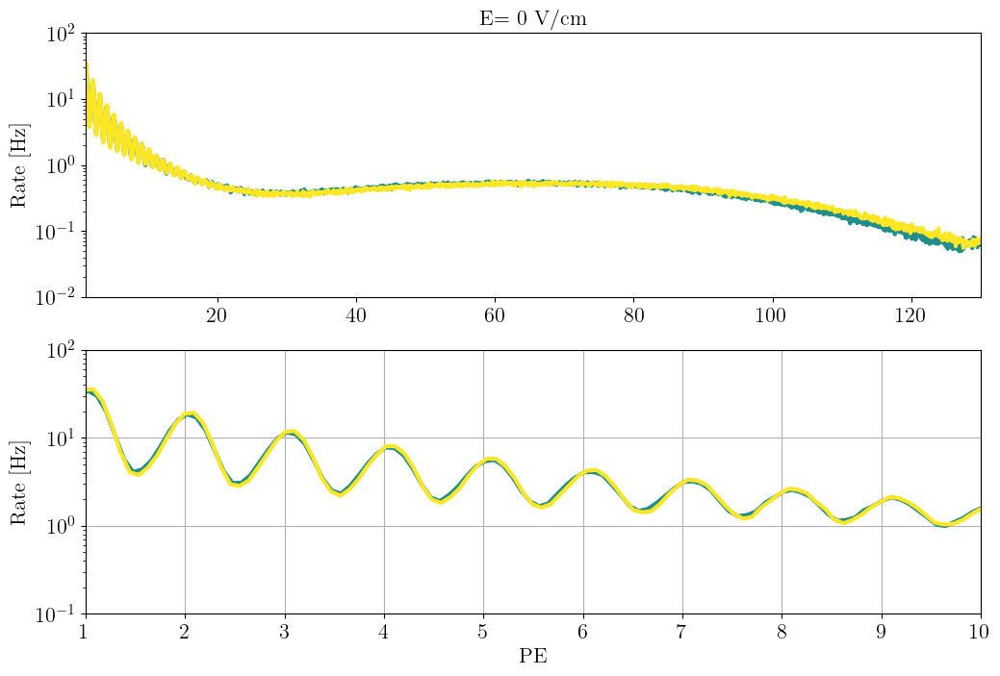

In [58]:

color_array,sm=get_color_map(len(calib_pe_0))
n_bins=1 # number of bins to rebin by
bin=30 #number of files to add together
avg=0

plt.figure(figsize=(12,8))


for i in range(len(calib_pe_0)):

    x,y=rebin_(calib_pe_0[i],calib_count_0[i],n_bins)
    avg+=y
    if (i%bin==bin-1):
        plt.subplot(2,1,1)
        plt.plot(x,avg/bin,lw=3,color=color_array[i])
        plt.title('E= 0 V/cm')
        plt.yscale('log')
        plt.xlim(1,130)
        plt.ylabel('Rate [Hz]')


        plt.subplot(2,1,2)
        plt.plot(x,avg/bin,lw=3,color=color_array[i])
        plt.yscale('log')
        plt.xlim(1,10)
        plt.ylim(1E-1,1E2)
        plt.ylabel('Rate [Hz]')
        avg=0
plt.xlabel('PE')
plt.grid()
plt.savefig('spectrum_comparison_0.pdf')
plt.show()


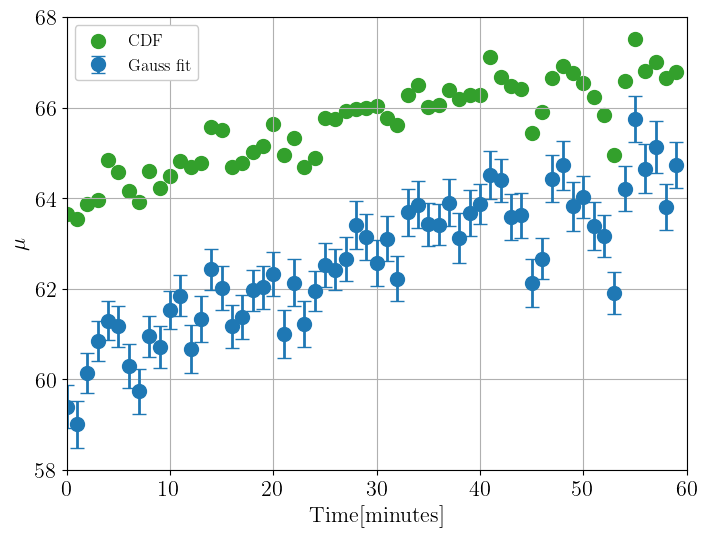

In [59]:

plt.figure(figsize=(8,6))
plt.errorbar(time_0V,np.array(mu_gauss_list_0V),yerr=np.array(mu_gauss_err_0V),fmt='o',label='Gauss fit')
# plt.errorbar(time_0V,np.array(mu_exp_gauss_list_0V),yerr=np.array(mu_exp_gauss_err_0V),fmt='o',label='gauss+exp')

plt.grid()
plt.xlabel('Time[minutes]')
plt.ylabel('$\mu$')
plt.scatter(time_0V,mu_cdf_0,label='CDF',color=colors[2])
# plt.scatter(time_0V,np.array(gain_single_pe_0),label='Gain (arb units)',color=colors[3])
plt.legend(loc=2)
plt.savefig('mu_0.pdf')
plt.show()

Number of files: 161


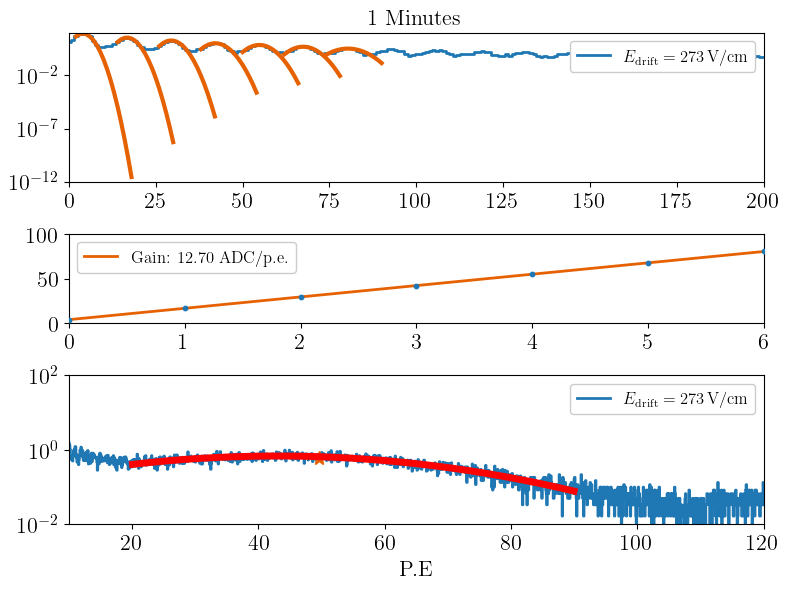

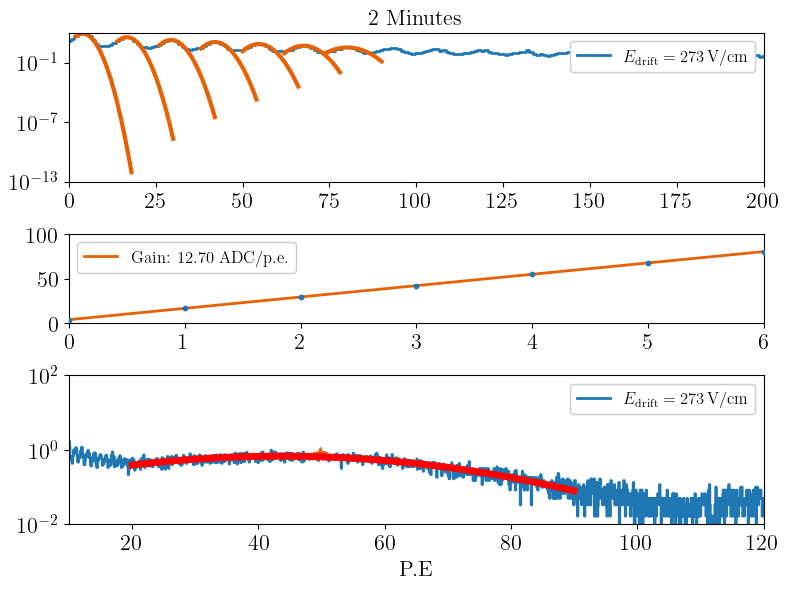

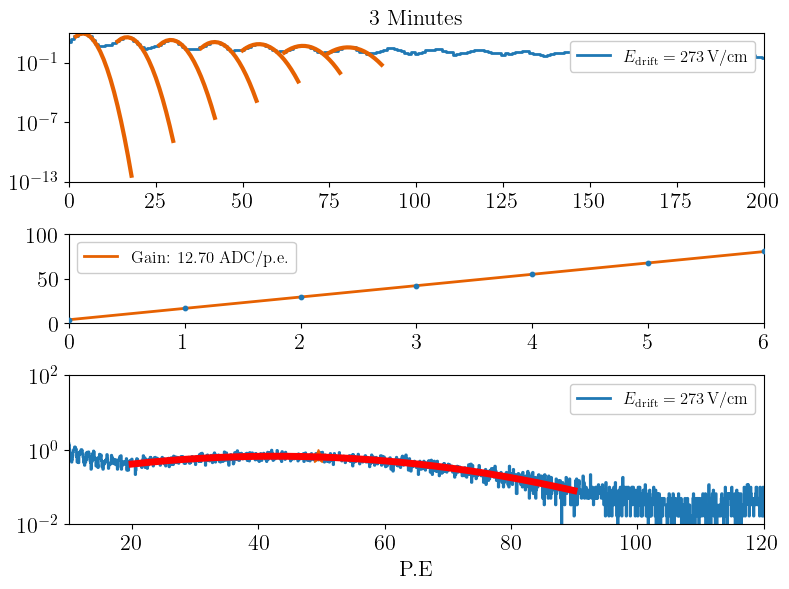

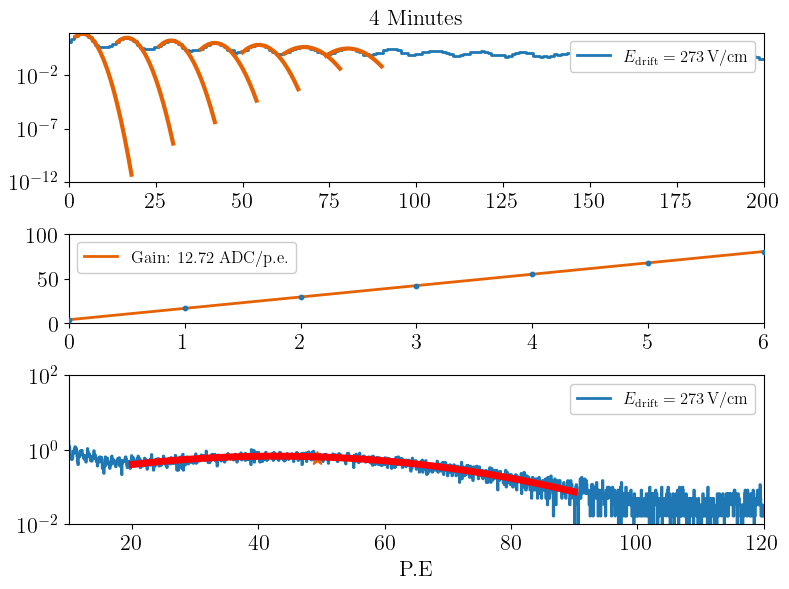

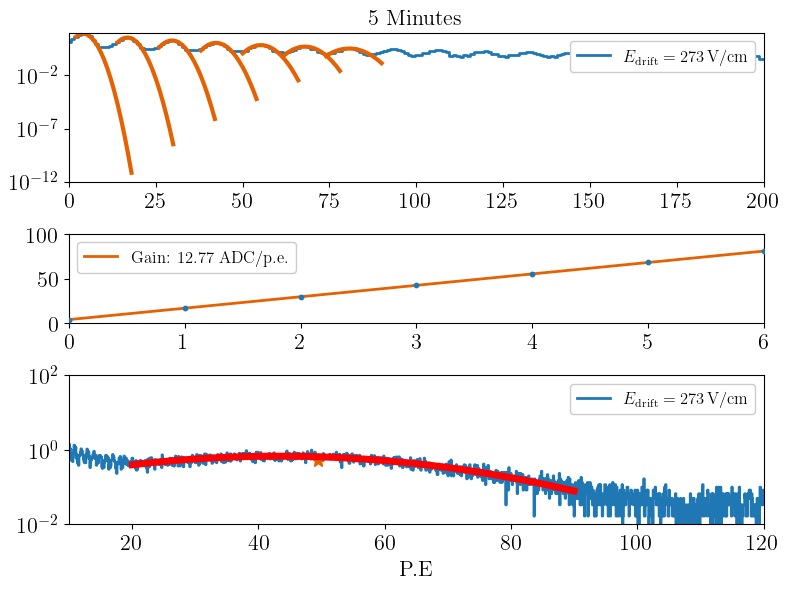

...

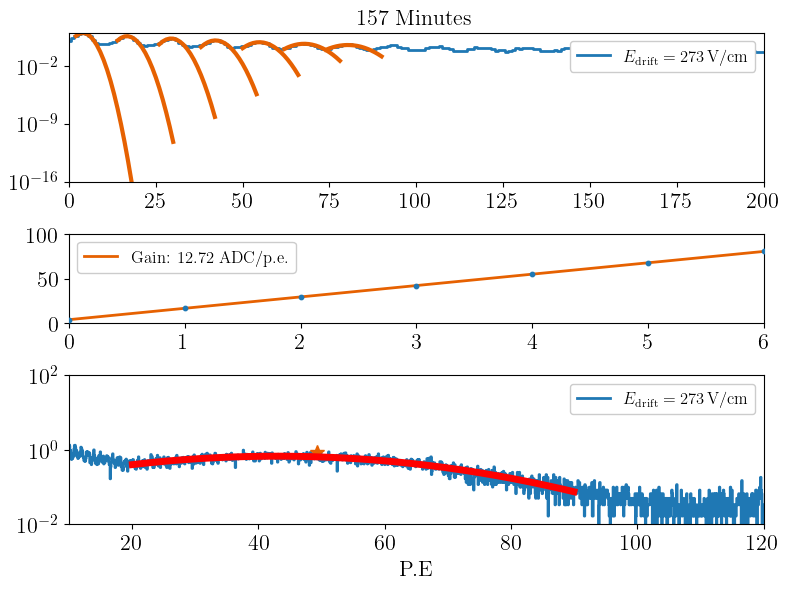

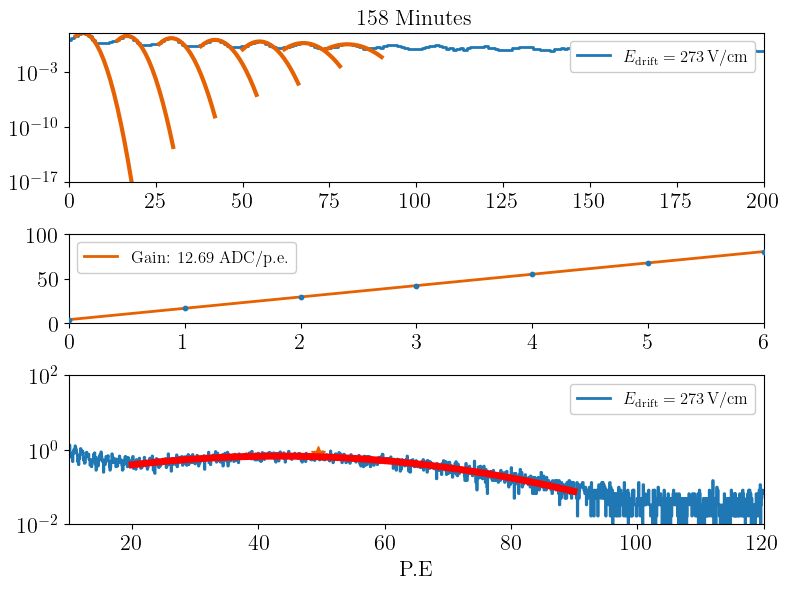

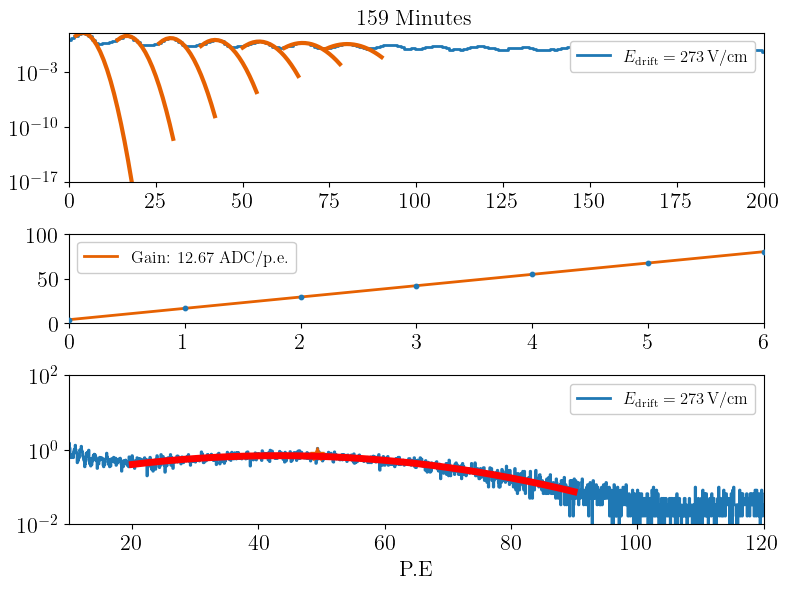

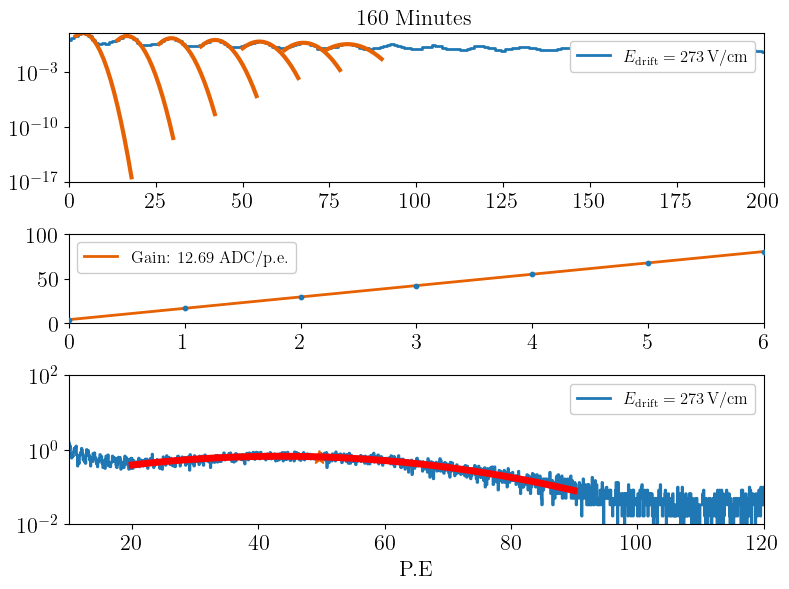

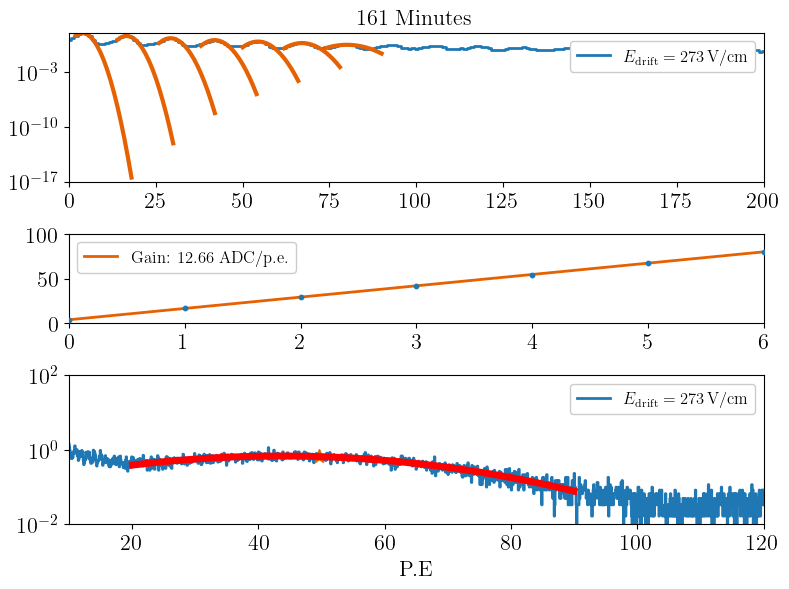

In [60]:
gain_single_pe_273=[]
intercept_273=[]
sumdata = 0

mu_cdf_273=[]

calib_pe_273=[]
calib_count_273=[]

mu_gauss_list_273V=[]
mu_gauss_err_273V=[]

BINS=10 #bins for rebinning


Path = "C:\\Users\\nEXO\\Downloads\\SiPM_response_LXe_273V\\"

Files = glob.glob(Path+"*.csv")
print('Number of files: {}'.format(len(Files)))

for j,f in enumerate(natsort.natsorted(Files)): 

    data = pd.read_csv(f, delimiter=',', skiprows=1)
    hx_wf,h_wf = rebin(np.array(data['Channel']), np.array(data['Counts']), 10)
    # h_wf = h_wf/np.sum(h_wf)
    h_wf=h_wf/60 #Divide by 60s to calculate the rate

    f, ax = plt.subplots(3, 1, gridspec_kw={'height_ratios': [5, 3, 5]})
    ax[0].set_xlim(0,200)
    ax[0].set_yscale('log')
    ax[0].step(hx_wf,h_wf, label='$E_\mathrm{{drift}} = {}\,$V/cm'.format(273), where='mid')
    ax[0].set_title(str(j+1)+' Minutes')
    p0 = hx_wf[np.where(h_wf == np.max(h_wf))][0]
    params = []
    for i in range(7):

        if(i>0): p0 = p0 + 12

        # select events around that peak
        cut = np.where((hx_wf>p0-3) & (hx_wf<p0+3))

        #find position of max in the selected region
        p0_max = hx_wf[np.where(h_wf == np.max(h_wf[cut]))][0]

        # redefine selection cut based on true peak position
        cut = np.where((hx_wf>p0-3) & (hx_wf<p0+15))

        # run and plot fit
        popt,pcov = curve_fit(gauss, hx_wf[cut], h_wf[cut], p0=[np.max(h_wf[cut]),p0,1],maxfev=100000)
        ax[0].plot(hx_wf[cut], gauss(hx_wf[cut], *popt), color=colors[1],lw=3)
        # ax[0].set_ylim(1E-5,1E-1)
        
        # append best fit parameters
        params.append(popt)
    ax[0].legend(loc='upper right')
    # ax[1].set_xlim(0,9)
    xdata = [i for i,x in enumerate(params)]
    ax[1].scatter(xdata, np.array(params)[:,1], s=10, zorder=10)
    popt_wf,pcov = curve_fit(line, xdata, np.array(params)[:,1], p0=[10,0] )
    gain_single_pe_273.append(popt_wf[0])
    intercept_273.append(popt_wf[1])
    ax[1].plot(xdata, line(xdata, *popt_wf), color=colors[1], label='Gain: {:.2f} ADC/p.e.'.format(popt_wf[0]))
    ax[1].legend(loc='upper left')
    calib_pe=hx_wf/popt_wf[0]+popt_wf[1]
    ax[2].step(calib_pe,h_wf, label='$E_\mathrm{{drift}} = {}\,$V/cm'.format(273))
    ax[2].set_xlim(10,120)
    ax[2].set_xlabel('P.E')
    # ax[2].set_ylim(0,1E-3)
    ax[2].set_yscale('log')
    ax[2].legend(loc='upper right')

    #append the calibrated data into a list of array

    calib_pe_273.append(np.array(calib_pe+1))
    calib_count_273.append(np.array(h_wf))

    # Now find the cdf of the source bump
    cut_median=np.where((calib_pe>25) & (calib_pe<110))
    cdf=np.cumsum(h_wf[cut_median])/np.sum(h_wf[cut_median])
    mu_interp=np.interp(0.5,cdf,calib_pe[cut_median])

    mu_idx=np.argmin(np.abs(calib_pe-mu_interp))
    ax[2].plot(calib_pe[mu_idx],h_wf[mu_idx],'*')
    mu_cdf_273.append(calib_pe[mu_idx])


    #now we fit the gaussian to the source bump
    cut_gauss=np.where((calib_pe>20) & (calib_pe<90))
    popt_bump,pcov_bump=curve_fit(gauss,calib_pe[cut_gauss],h_wf[cut_gauss],p0=[np.max(h_wf[cut_gauss]),60,100],maxfev=100000)
    ax[2].plot(calib_pe[cut_gauss],gauss(calib_pe[cut_gauss],*popt_bump),color='r',lw=5,label=str(popt_bump))
    mu_gauss_list_273V.append(popt_bump[1])
    mu_gauss_err_273V.append(np.sqrt(np.diag(pcov_bump))[1])





    plt.tight_layout()
    plt.show()

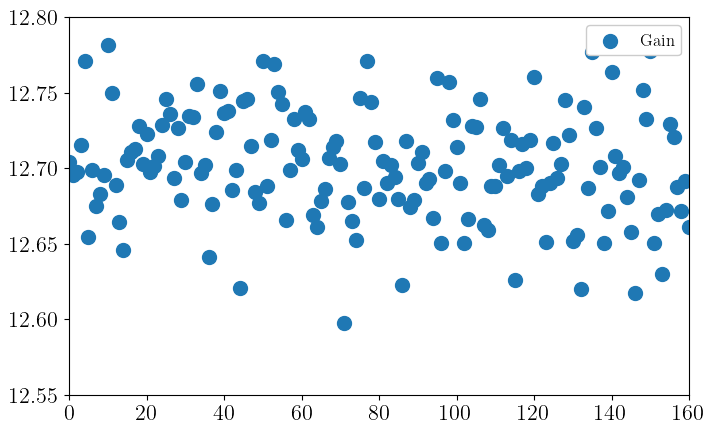

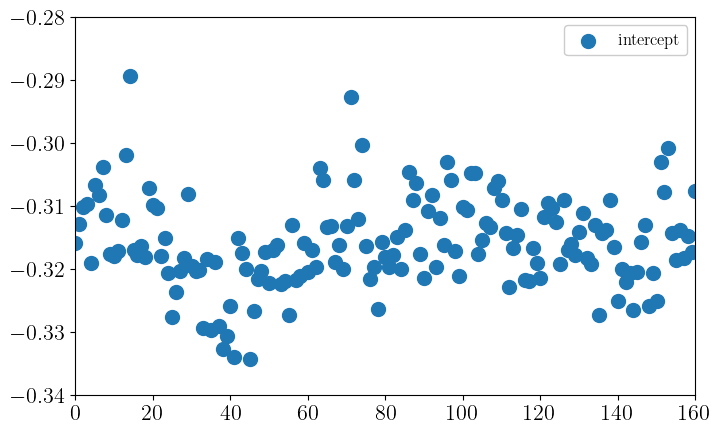

In [61]:
time_273V=np.arange(0,161,1)
plt.figure(figsize=(8,5))
plt.scatter(time_273V,gain_single_pe_273,label='Gain')
plt.legend(loc=1)
plt.figure(figsize=(8,5))
plt.scatter(time_273V,intercept_273,label='intercept')
plt.legend(loc=1)
plt.show()

<ipython-input-62-a03a47763013>:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,1,1)
<ipython-input-62-a03a47763013>:22: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  plt.subplot(2,1,2)
<ipython-input-62-a03a47763013>:14: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and re

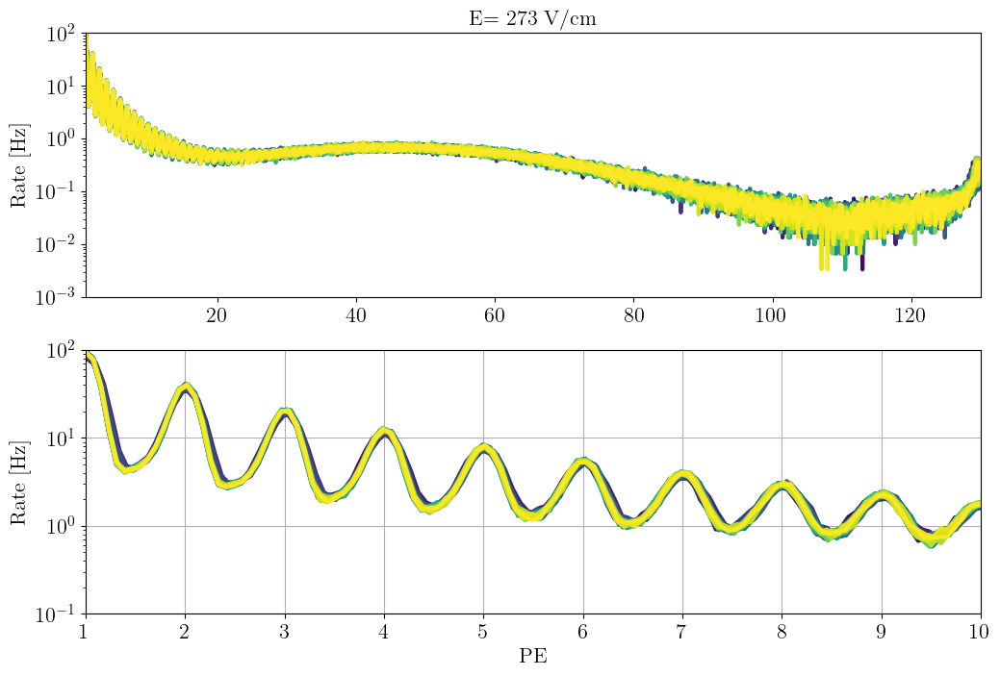

In [62]:

color_array,sm=get_color_map(len(calib_pe_273))
n_bins=1 # number of bins to rebin by
bin=5 #number of files to add together
avg=0

plt.figure(figsize=(12,8))


for i in range(len(calib_pe_273)):

    x,y=rebin_(calib_pe_273[i],calib_count_273[i],n_bins)
    avg+=y
    if (i%bin==bin-1):
        plt.subplot(2,1,1)
        plt.plot(x,avg/bin,lw=3,color=color_array[i])
        plt.title('E= 273 V/cm')
        plt.yscale('log')
        plt.xlim(1,130)
        plt.ylabel('Rate [Hz]')


        plt.subplot(2,1,2)
        plt.plot(x,avg/bin,lw=3,color=color_array[i])
        plt.yscale('log')
        plt.xlim(1,10)
        plt.ylim(0.1,100)
        plt.ylabel('Rate [Hz]')
        avg=0
plt.xlabel('PE')
plt.grid()
plt.savefig('spectrum_comparison_273.pdf')
plt.show()


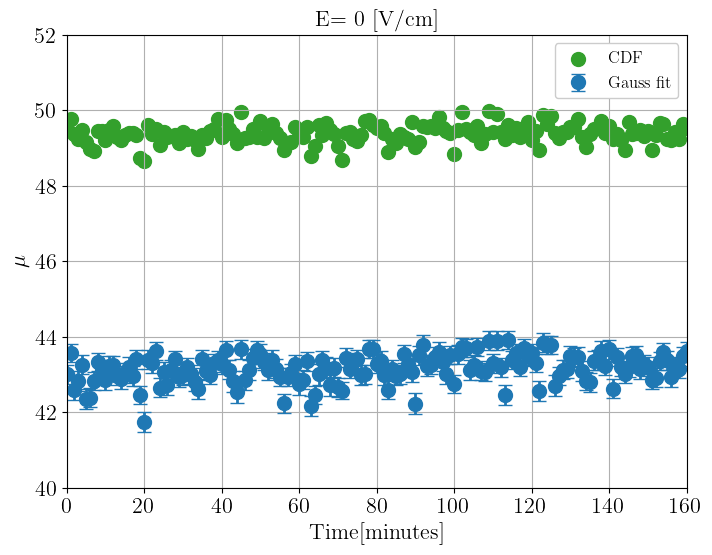

In [63]:

plt.figure(figsize=(8,6))
plt.errorbar(time_273V,np.array(mu_gauss_list_273V),yerr=np.array(mu_gauss_err_273V),fmt='o',label='Gauss fit')

plt.grid()
plt.xlabel('Time[minutes]')
plt.ylabel('$\mu$')
plt.scatter(time_273V,mu_cdf_273,label='CDF',color=colors[2])
plt.legend(loc=1)
plt.ylim(40,52)
plt.savefig('mu_273.pdf')
plt.title('E= 0 [V/cm]')
plt.show()


1638
1638


<Figure size 1500x6000 with 0 Axes>

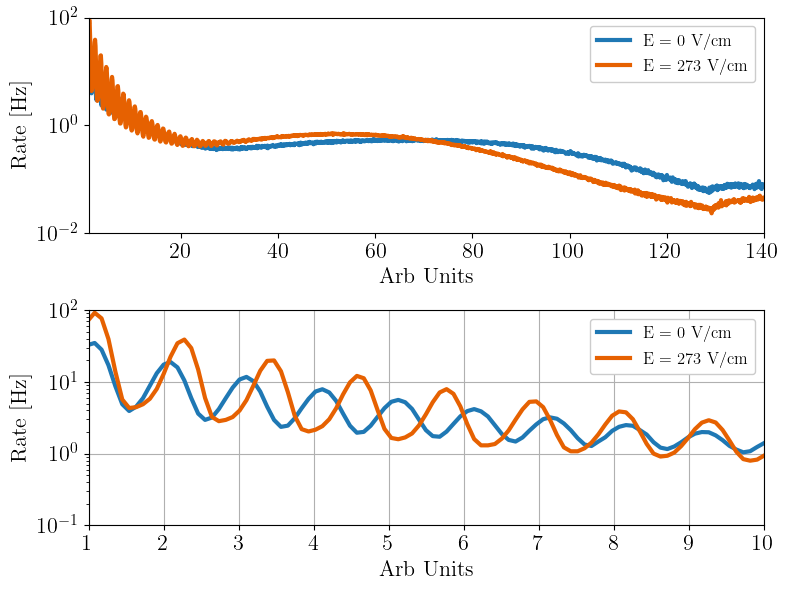

In [64]:

n_bins=1 # number of bins to rebin by
avg_0=0
avg_273=0

plt.figure(figsize=(15,60))
f,ax= plt.subplots(2,1,gridspec_kw={'height_ratios': [5, 5]})


for i in range(len(calib_pe_273)):
    x,y=rebin_(calib_pe_273[i],calib_count_273[i],n_bins)
    avg_273+=y
print(len(avg_273))
for i in range(len(calib_pe_0)):
    x,y=rebin_(calib_pe_0[i],calib_count_0[i],n_bins)
    avg_0+=y
print(len(avg_0))

ax[0].plot(x,avg_0/(60),lw=3,label='E = 0 V/cm')
ax[0].plot(x,avg_273/(161),lw=3,label='E = 273 V/cm')
ax[0].set_yscale('log')
ax[0].set_xlim(1,140)
ax[0].set_ylabel('Rate [Hz]')
ax[0].set_xlabel('Arb Units')
ax[0].legend(loc=1)

ax[1].plot(x,avg_0/(60),lw=3,label='E = 0 V/cm')
ax[1].plot(x,avg_273/(161),lw=3,label='E = 273 V/cm')
ax[1].set_yscale('log')
ax[1].set_xlim(1,10)
ax[1].set_ylim(0.1,100)
ax[1].set_ylabel('Rate [Hz]')
ax[1].set_xlabel('Arb Units')
ax[1].legend(loc=1)


# p0_0 = x[np.where(avg_0 == np.max(avg_0))][0]
# p0_273 = x[np.where(avg_273 == np.max(avg_273))][0]
# params_0 = []
# params_273=[]
# for i in range(3):

#     if(i>0): p0_0 = p0_0 + 1
#     if(i>0): p0_273 = p0_273 + 1


#     # select events around that peak
#     cut_0 = np.where((x>p0_0-0.5) & (x<p0_0+0.5))
#     cut_273 = np.where((x>p0_273-0.5) & (x<p0_273+0.5))


# #     #find position of max in the selected region
#     # p0_max = x[np.where(avg_0 == np.max(avg_0[cut]))][0]

# #     # redefine selection cut based on true peak position
#     cut_0 = np.where((x>p0_0-0.5) & (x<p0_0+0.5))
#     cut_273 = np.where((x>p0_273-0.5) & (x<p0_273+0.6))

# #     # run and plot fit
#     # popt_0,pcov_0 = curve_fit(gauss, x[cut_0], avg_0[cut_0], p0=[np.max(avg_0[cut_0]),p0_0,1],maxfev=100000)
#     # ax[2].plot(x[cut_0], gauss(x[cut_0], *popt_0), color='r',lw=8)

#     popt_273,pcov_273 = curve_fit(gauss, x[cut_273], avg_273[cut_273], p0=[np.max(avg_273[cut_273]),p0_273,1],maxfev=100000)
#     ax[2].plot(x[cut_273], gauss(x[cut_273], *popt_273), color='r',lw=8)

#     # ax[2].plot(x,avg_0,lw=3,label='E = 0 V/cm')
#     ax[2].plot(x,avg_273,lw=3,label='E = 273 V/cm')

#     ax[2].set_xlim(0,10)

        
#     # append best fit parameters
#     params_0.append(popt_0)
#     params_273.append(popt_273)


# xdata = [i for i,x in enumerate(params_0)]
# ax[3].scatter(xdata, np.array(params_0)[:,1], s=10, zorder=10)
# popt_nof,pcov = curve_fit(line, xdata, np.array(params_0)[:,1], p0=[10,0] )
# ax[3].plot(xdata, line(xdata, *popt_nof), color=colors[1], label='Gain: {:.2f} ADC/p.e.'.format(popt_nof[0]))

# xdata = [i for i,x in enumerate(params_273)]
# ax[3].scatter(xdata, np.array(params_273)[:,1], s=10, zorder=10)
# popt_wf,pcov = curve_fit(line, xdata, np.array(params_273)[:,1], p0=[10,0] )
# ax[3].plot(xdata, line(xdata, *popt_wf), color=colors[1], label='Gain: {:.2f} ADC/p.e.'.format(popt_wf[0]))

# #     ax[1].legend(loc='upper left')

# ax[2].set_yscale('log')

# ax[2].set_ylabel('Normalized Counts')
# ax[2].set_xlabel('PE')
# ax[3].legend(loc=1)

plt.tight_layout()
plt.grid()
plt.savefig('calibrated_field_comparison.pdf')
plt.show()